# Fixed-radius circular swath profile

## At the beginning

Similar to fixed-width curvilinear swath profile, fixed-radius swath profile here refers to traditional circular swath profile. It usually starts from defining a central point, then profile-lines are stacked along radial directions outwards until a certain length is reached. To create a fixed-radius circular swath object, `Orig_cir` is the class to call.

[comment]: # (It is better to add cross-reference of the calss)

<img alt="homo_circle" src="https://i.imgur.com/VYQPVTj.png[/img]" height="250"/>

## Generate a swath object

In [2]:
import pyosp

center = pyosp.datasets.get_path("center.shp")  # path to the central point shapefile
raster = pyosp.datasets.get_path("crater.tif")  # path to the raster tif

orig = pyosp.Orig_cir(center, raster, radius=80,
                      ng_start=0, ng_end=360,
                      ng_stepsize=5, radial_stepsize=None)

Processing: [#########################] 72 of 72 lineSteps

## Swath polygon and polylines

Using methods *out_polygon()* or *out_polylines()*, we can generate [shapely](https://shapely.readthedocs.io/en/latest/manual.html) objects to be plotted with Matplotlib.

PyOSP also provides function *read_shape* to let us read the center point shapefile into shapely object, and plot with polygon and polylines as below:

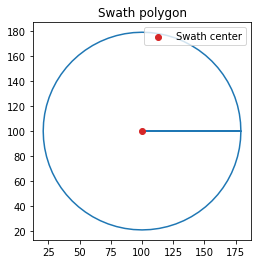

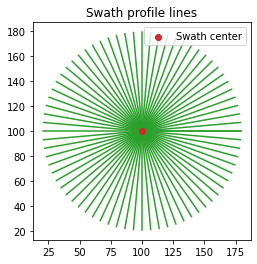

In [3]:
import matplotlib.pyplot as plt
from pyosp import read_shape

# Read the center point shapefile
center_shape = read_shape(center)
cx, cy = center_shape.x, center_shape.y

# Plot the swath polygon
fig, ax = plt.subplots()
swath_polygon = orig.out_polygon()
px, py = swath_polygon.exterior.xy
ax.plot(px, py)
ax.scatter(cx, cy, color='C3', label="Swath center", zorder=3)
ax.set_aspect('equal', adjustable='box')
ax.set_title("Swath polygon")
ax.legend(loc=1)

# Plot the swath profile lines
fig, ax = plt.subplots()
swath_polylines = orig.out_polylines()
for line in swath_polylines:
    x, y = line.xy
    ax.plot(x, y, color='C2')

ax.scatter(cx, cy, color='C3', label="Swath center", zorder=3)
ax.set_aspect('equal', adjustable='box')
ax.set_title("Swath profile lines")
ax.legend(loc=1)

If plotting together with raster profile,

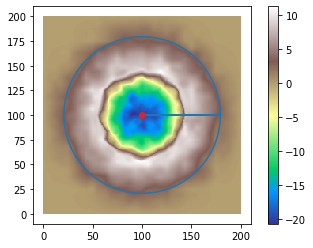

In [4]:
import numpy as np
import gdal

ds = gdal.Open(raster)
data = ds.ReadAsArray()
gt = ds.GetGeoTransform()

xRes = gt[1]
yRes = gt[5]

# get the edge coordinates and add half the resolution 
# to go to center coordinates
xmin = gt[0] + xRes * 0.5
xmax = gt[0] + (xRes * ds.RasterXSize) - xRes * 0.5
ymin = gt[3] + (yRes * ds.RasterYSize) + yRes * 0.5
ymax = gt[3] - yRes * 0.5

ds = None

# create a grid of xy coordinates 
xy = np.mgrid[xmin:xmax+xRes:xRes, ymax+yRes:ymin:yRes]

fig, ax = plt.subplots()
ax.plot(px, py, color="C0", label='swath polygon')
im = ax.pcolormesh(xy[0], xy[1], data.T, cmap=plt.cm.terrain)
ax.scatter(cx, cy, color='C3', label="Swath center", zorder=3)
ax.set_aspect('equal', adjustable='box')
ax.set_xlim([-10, 210])
ax.set_ylim([-10, 210])
plt.colorbar(im)

PyOSP supports exporting polygon or polylines as shapefiles. Hence the result can be read and processed in other GIS softwares like ArcGIS, QGIS, etc. For example:

In [5]:
# This will generate polygon and polyline shapefiles in the current folder
pyosp.write_polygon(orig.out_polygon(), "./orig_polygon.shp")
pyosp.write_polylines(orig.out_polylines(), "./orig_polylines.shp")

## Swath profile

To plot the corresponding swath profile, simply run method:

<AxesSubplot:xlabel='Distance', ylabel='Elevation'>

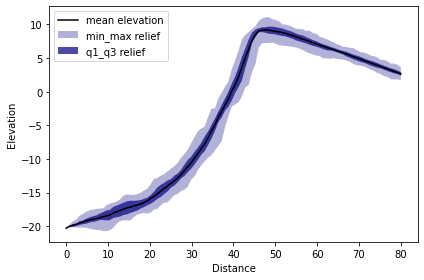

In [6]:
orig.profile_plot()

If figure needs to be customized, an axis argument can be passed to the object:

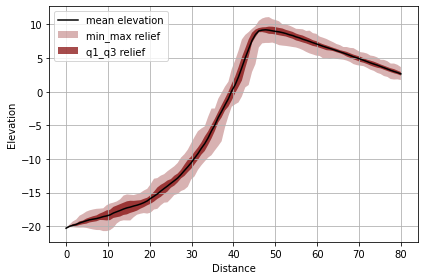

In [7]:
fig, ax = plt.subplots()
orig.profile_plot(ax=ax, color="maroon")
ax.grid()

## Summary

This section covers the basic usage of PyOSP to perform traditional fixed-radius swath profile. For more examples and advance topics, please refer to our example gallery.